<a href="https://colab.research.google.com/github/Rachita-G/Python_Practice/blob/main/Models/Regularization_Ridge%2C_Lasso_and_Elastic_Net.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# REGULARISATION

Regularization helps to solve over fitting problem in machine learning. Simple model will be a very poor generalization of data. At the same time, complex model may not perform well in test data due to over fitting. We need to choose the right model in between simple and complex model. Regularization helps to choose preferred model complexity, so that model is better at predicting. Regularization is nothing but adding a penalty term to the objective function and control the model complexity using that penalty term. It can be used for many machine learning algorithms.


### Why Regularization
* Over fitting
* Over fitting with linear models
* Regularization of linear models
* Regularized regression in scikit-learn
* Comparing regularized linear models with unregularized linear models.

### Causes of Overfitting
* **Cause 1: Irrelevant features**
Linear models can over-fit if we include “irrelevant features”, meaning features that are unrelated to the response.
Because it will learn a coefficient for every feature you include in the model, regardless of whether that feature has the impact or the noise.
This is especially a problem when p (number of features) is close to n (number of observations), because that model will naturally have high variance.
* **Cause 2: Correlated features(Multicollinearity)**
Linear models can over-fit if the included features are highly correlated with one another. 
We use OLS (Ordinary Least Squares ) method (OLS takes some assumptions)
“Coefficient estimates for Ordinary Least Squares rely on the independence of the model terms. When terms are correlated and the columns of the design matrix X have an approximate linear dependence, the design matrix becomes close to singular and as a result, the least-squares estimate becomes highly sensitive to random errors in the observed response, producing a large variance.”
* **Cause 3: Large coefficients**
Linear models can over-fit if the coefficients (after feature standardization) are too large.
Because the larger the absolute value of the coefficient, the more power it has to change the predicted response, resulting in a higher variance.

### Regularization of linear models
Regularization is a method for “constraining” or “regularizing” the size of the coefficients, thus “shrinking” them towards zero.
It reduces model variance and thus minimizes overfitting.
If the model is too complex, it tends to reduce variance more than it increases bias, resulting in a model that is more likely to generalize.
Our aim is to locate the optimum model complexity, and thus regularization is useful when we believe our model is too complex.
![image.png](attachment:image.png)


## Ridge Regression (L2 Regularization)

When the sample sizes are relatively small, then Ridge regression can improve the predictions made from the new data (ie, reduce the variance) by making the predictions less sensitive to the Training data.

**MAIN IDEA- by starting with a slightly worse fit, the Ridge regression provided a better long term predictions**

Traditional linear fitting involves minimizing the `RSS (residual sum of squares)`. In ridge regression, a new penalty is created, and now the parameters will minimize: `RSS+ λ*slope^2` where `λ*slope^2` is called ridge regression penalty. The ridge regression penalty has all the patameters squared except the y intercept.

Where lambda is a tuning parameter. As lambda increases, the changes in dep variable is sensitive to the charges in indep variable beacuse the steeper the slope , the more sensitive is the changes in y to changes in X. 
If lambda is large enough, some coefficients will effectively become symptotically close to 0 but not 0. 
This parameter is found using cross-validation (usually 10 fold) as it must minimize the test error. Therefore, a range of lambdas is used to fit the model and the lambda that minimizes the test error is the optimal value.

With the small amount of bias, that the penalty creates, least squares fit has a large amount of variance but the ridge regression has a small anount of bias due to the penalty and has less variance.

Ridge regression will include all x predictors in the model. Hence, it is a good method to improve the fit of the model, but it will not perform variable selection.

Note that for n parameters to be estimated in the model (for i number of indep variables, parameters to be estimated us i+1 which also includes y intercept) , the least squares needs atleast n data points to estiamte all n parameters. but sometimes we dont have as many data as the variables in the model. The Ridge regression , however, can solve for all the n parameter even if there are less than n data points available. 

Hence, when there isn't enough data to find the least sqaures parameter estimates , Ridge regression can still find a solution with cross validation and the ridge regression penalty.

# Lasso Regression (L1 Regularization)

LASSO stands for Least Absolute Shrinkage and Selection Operator. In lasso regression, the parameters will minimize: `RSS+ λ*|slope|` where `RSS+ λ*|slope|` is called lasso regression penalty. 

Notice that we use the absolute value of the parameter beta instead of its squared value. Also, the same tuning parameter is present.
However, if lambda is large enough, some coefficients will effectively be 0! Therefore, lasso can also perform variable selection, making the model much easier to interpret.


![image.png](attachment:image.png)


In this diagram:
* We are fitting a linear regression model with two features, 𝑥1 and 𝑥2.
* 𝛽̂ represents the set of two coefficients, 𝛽1 and 𝛽2, which minimize the RSS for the unregularized model.
* Regularization restricts the allowed positions of 𝛽̂ to the blue constraint region:
* For lasso, this region is a diamond because it constrains the absolute value of the coefficients.
* For ridge, this region is a circle because it constrains the square of the coefficients.
* The size of the blue region is determined by λ, with a smaller λ resulting in a larger region:
* When λ is zero, the blue region is infinitely large, and thus the coefficient sizes are not constrained.
* When λ increases, the blue region gets smaller and smaller.
In this case, 𝛽̂ is not within the blue constraint region. Thus, we need to move 𝛽̂ until it intersects the blue region, while increasing the RSS as little as possible.


### Hyper Parameter λ
A standard least squares model tends to have some variance in it, i.e. this model won’t generalize well for a data set different than its training data. Regularization, significantly reduces the variance of the model, without substantial increase in its bias. So the tuning parameter λ, used in the regularization techniques described above, controls the impact on bias and variance. As the value of λ rises, it reduces the value of coefficients and thus reducing the variance. Till a point, this increase in λ is beneficial as it is only reducing the variance(hence avoiding overfitting), without loosing any important properties in the data. But after certain value, the model starts loosing important properties, giving rise to bias in the model and thus underfitting. Therefore, the value of λ should be carefully selected.

### How should we choose between Lasso regression and Ridge regression?
* Lasso regression is preferred if we believe many features are irrelevant or if we prefer a sparse model.
* If model performance is your primary concern, it is best to try both.
* Elastic-Net regression is a combination of lasso regression and ridge Regression.

### Should features be standardized?
Yes, because otherwise, features would be penalized simply because of their scale.
Also, standardizing avoids penalizing the intercept, which wouldn’t make intuitive sense.

## Elastic Net Regression

When you use the models which involves a lot of parameters, then you certainly need to use some sort of regularization in order to estimate them. However, the variables in the model can be useful or useless and we dont know that in advance. So, it becojmes difficult to choose between ridge and lasso regression. Good news is that-- You dont have to use neither, instead use Elastic Net Regression.
Parameters are estimated by minimising $RSS+ λ_1* |slope| +  λ_2* slope^2 = RSS+ LaasoPenalty + RidgePenalty$

The elastic net method includes the LASSO and ridge regression: in other words, each of them is a special case where ${\displaystyle \lambda _{1}=\lambda ,\lambda _{2}=0}$ or ${\displaystyle \lambda _{1}=0,\lambda _{2}=\lambda }$. Meanwhile, the naive version of elastic net method finds an estimator in a two-stage procedure : first for each fixed ${\displaystyle \lambda _{1}} $ it finds the ridge regression coefficients, and then does a LASSO type shrinkage. 

Cross Validation on different combination of lambda values to find the best values for each lambda.

This method of regression is especially good in dealing with the situations when there are correlation between parameters. This is because Lasso pics just one of the correlated terms and eliminate the others whereas ridge tries to shrink the oarameters for the correlated varaibles together. By combining both of them, Elastic net regression groups and shrinks the parameters associated with the correlated variables and leaves them in equation or removes them all at once.

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
os.getcwd()

'C:\\Users\\sanjana grover\\Desktop\\RACHITA\\Python\\Codes'

In [ ]:
from sklearn.datasets import load_boston
boston=load_boston()
print(boston['DESCR'])

.. _boston_dataset:

Boston house prices dataset
---------------------------

**Data Set Characteristics:**  

    :Number of Instances: 506 

    :Number of Attributes: 13 numeric/categorical predictive. Median Value (attribute 14) is usually the target.

    :Attribute Information (in order):
        - CRIM     per capita crime rate by town
        - ZN       proportion of residential land zoned for lots over 25,000 sq.ft.
        - INDUS    proportion of non-retail business acres per town
        - CHAS     Charles River dummy variable (= 1 if tract bounds river; 0 otherwise)
        - NOX      nitric oxides concentration (parts per 10 million)
        - RM       average number of rooms per dwelling
        - AGE      proportion of owner-occupied units built prior to 1940
        - DIS      weighted distances to five Boston employment centres
        - RAD      index of accessibility to radial highways
        - TAX      full-value property-tax rate per $10,000
        - PTRATIO  pu

In [ ]:
# prints many statements at the same time
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity="all"

In [ ]:
boston.keys()
boston.feature_names
boston.data.shape

dict_keys(['data', 'target', 'feature_names', 'DESCR', 'filename'])

array(['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD',
       'TAX', 'PTRATIO', 'B', 'LSTAT'], dtype='<U7')

(506, 13)

In [ ]:
dt=pd.DataFrame(boston.data,columns=boston.feature_names)
dt['Price']=boston.target
dt.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,Price
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33,36.2


In [ ]:
import pandas_profiling as pp
pp.ProfileReport(dt)

In [ ]:
def scatter_plot(feature,target='Price'):
    plt.figure(figsize=(12,8))
    plt.scatter(dt[feature],dt[target])
    plt.xlabel('Feature- {}'.format(feature))
    plt.ylabel('Price')
    plt.title('{}'.format(feature),fontsize=20)
    plt.show()

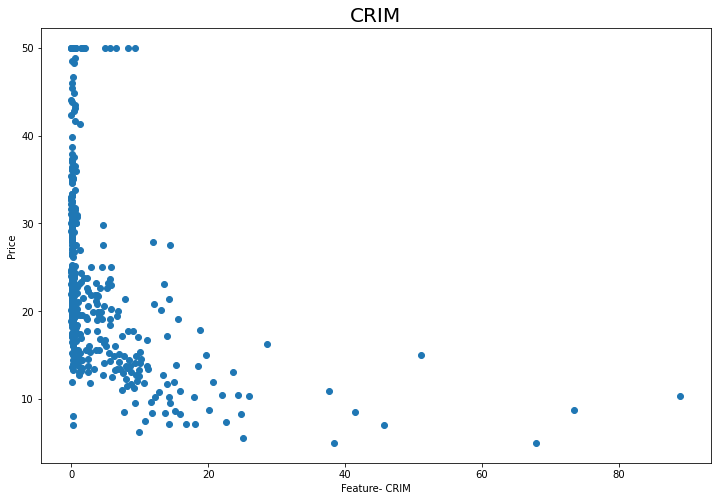

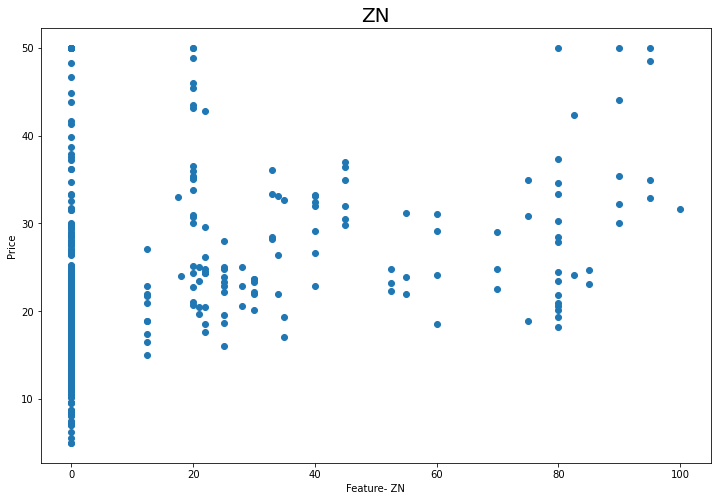

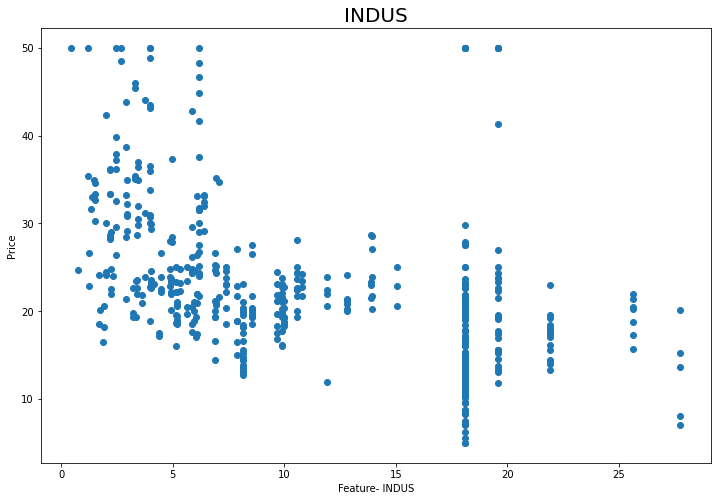

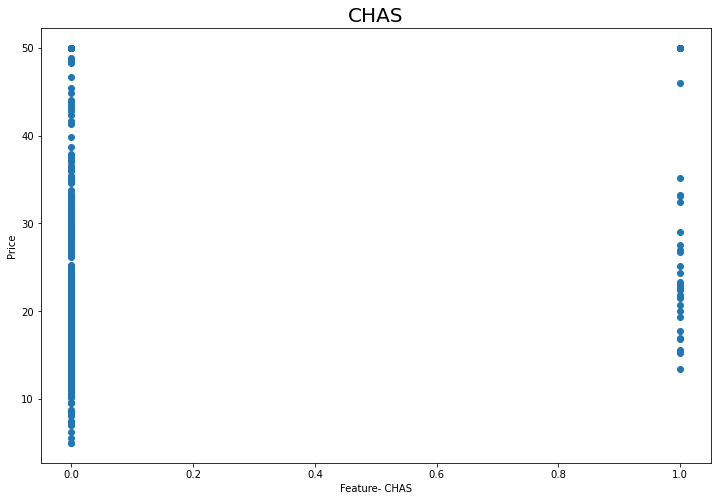

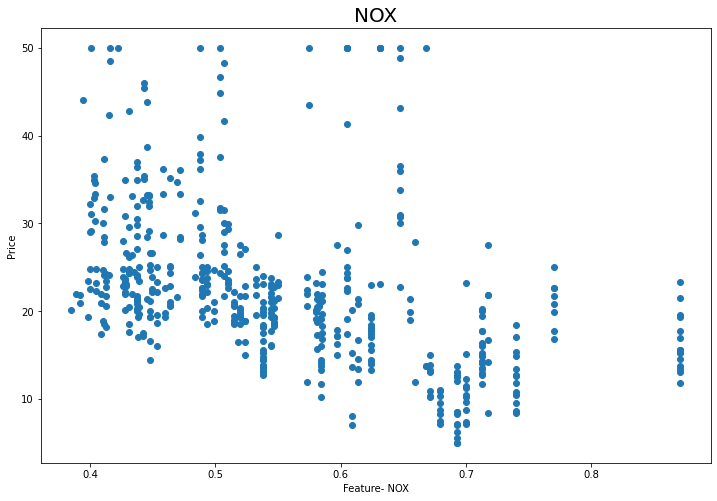

...

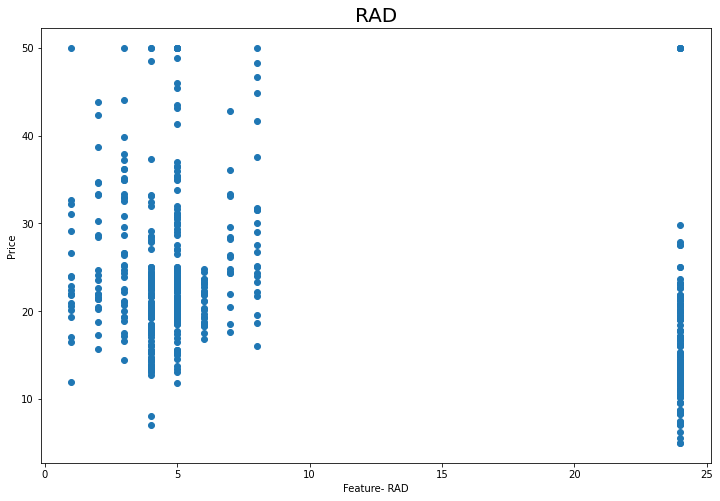

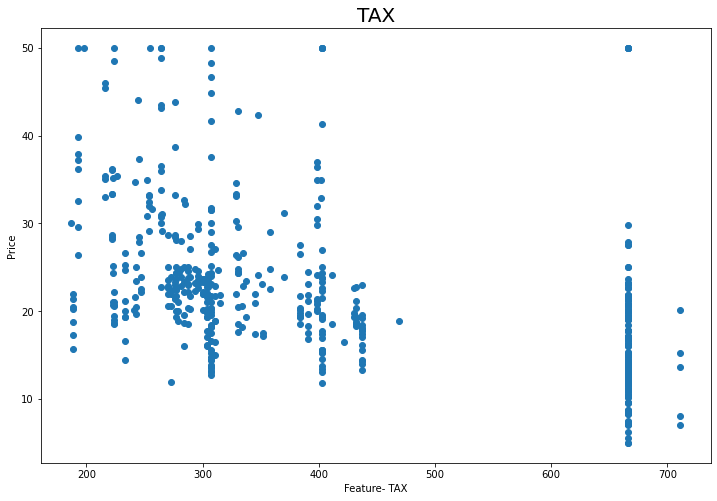

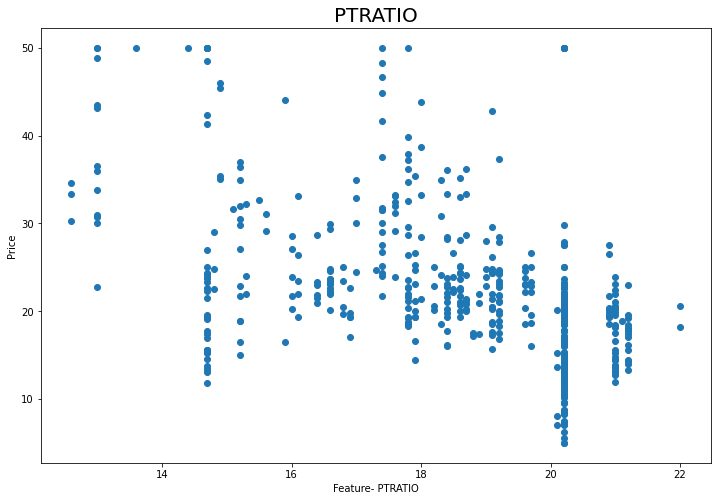

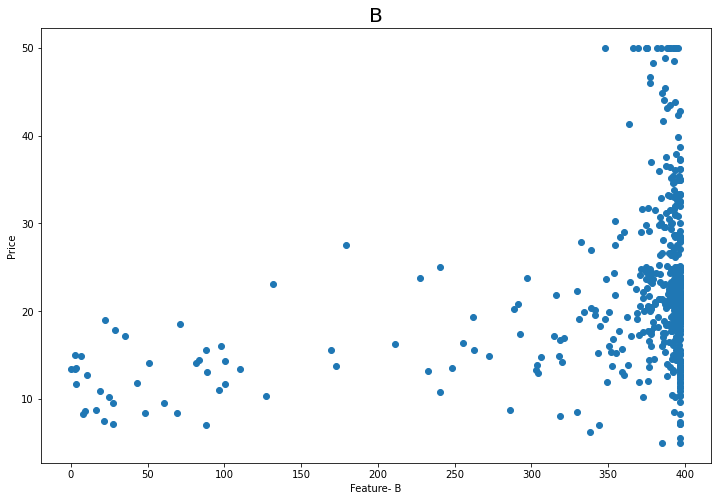

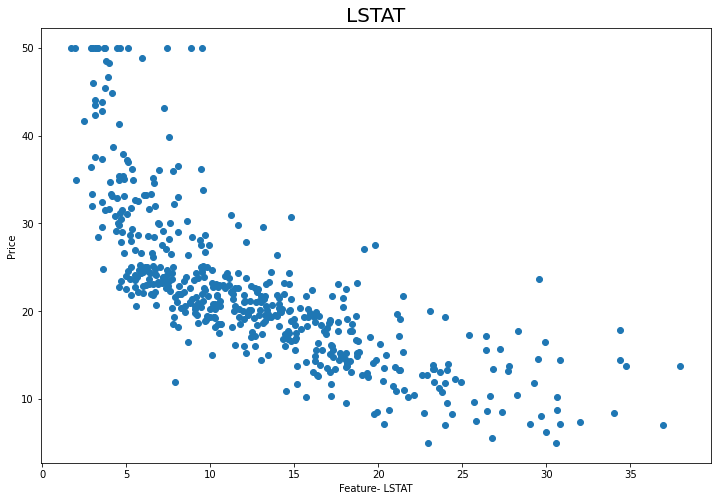

In [ ]:
features=boston.feature_names
for feature in features:
    scatter_plot(feature)

In [ ]:
dt.isna().sum().sum()

0

In [ ]:
dt.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,Price
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33,36.2


In [ ]:
X=dt.drop(['Price'],axis=1)
y=dt['Price']

In [ ]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.3)

In [ ]:
# build a linear regression model
from sklearn.linear_model import LinearRegression
linreg = LinearRegression()
linreg.fit(X_train, y_train)
LinearRegression(normalize=True)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True)

In [ ]:
y_pred = linreg.predict(X_test)
# calculate R^2 value, MAE, MSE, RMSE

from sklearn.metrics import r2_score
from sklearn import metrics
print("R-Square Value",r2_score(y_test,y_pred))
print("\n")
print ("mean_absolute_error :",metrics.mean_absolute_error(y_test, y_pred))
print("\n")
print ("mean_squared_error : ",metrics.mean_squared_error(y_test, y_pred))
print("\n")
print ("root_mean_squared_error : ",np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

R-Square Value 0.6336165970898742


mean_absolute_error : 3.337407274464512


mean_squared_error :  28.244983688328855


root_mean_squared_error :  5.314600990509904


MSE is more popular than MAE because MSE "eliminates" larger errors. But, RMSE is even more better than MSE because RMSE is interpretable in the "y" units.

# Ridge Regression

* alpha: value of lambda specified. must be positive, increase for more regularization . alpha=0 is equivalent to linear regression0 
* normalize: scales the features (without using StandardScaler) . If True, the regressors X will be normalized before regression by subtracting the mean and dividing by the l2-norm. If you wish to standardize, please use sklearn.preprocessing.StandardScaler before calling fit on an estimator with normalize=False.

In [ ]:
# try alpha=0.1
from sklearn.linear_model import Ridge
ridgereg = Ridge(alpha=0.1, normalize=True)
ridgereg.fit(X_train, y_train)
y_pred = ridgereg.predict(X_test)

# calculate R^2 value, MAE, MSE, RMSE

from sklearn import metrics
print("R-Square Value",r2_score(y_test,y_pred))
print("\n")
print ("mean_absolute_error :",metrics.mean_absolute_error(y_test, y_pred))
print("\n")
print ("mean_squared_error : ",metrics.mean_squared_error(y_test, y_pred))
print("\n")
print ("root_mean_squared_error : ",np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

Ridge(alpha=0.1, copy_X=True, fit_intercept=True, max_iter=None, normalize=True,
      random_state=None, solver='auto', tol=0.001)

R-Square Value 0.617939939181982


mean_absolute_error : 3.273724714223412


mean_squared_error :  29.45351809075794


root_mean_squared_error :  5.427109552124219


# RidgeCV: 
ridge regression with built-in cross-validation of the alpha parameter
* alphas: array of alpha values to try

In [ ]:
# create an array of alpha values
alpha_range = 10.**np.arange(-2, 3)
alpha_range # alhpha values should be positive

array([1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02])

In [ ]:
# select the best alpha with RidgeCV
from sklearn.linear_model import RidgeCV
ridgeregcv = RidgeCV(alphas=alpha_range, normalize=True, scoring='neg_mean_squared_error')
ridgeregcv.fit(X_train, y_train)
ridgeregcv.alpha_

RidgeCV(alphas=array([1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02]), cv=None,
        fit_intercept=True, gcv_mode=None, normalize=True,
        scoring='neg_mean_squared_error', store_cv_values=False)

0.01

In [ ]:
# predict method uses the best alpha value
y_pred = ridgeregcv.predict(X_test)
# calculate R^2 value, MAE, MSE, RMSE

from sklearn import metrics
print("R-Square Value",r2_score(y_test,y_pred))
print("\n")
print ("mean_absolute_error :",metrics.mean_absolute_error(y_test, y_pred))
print("\n")
print ("mean_squared_error : ",metrics.mean_squared_error(y_test, y_pred))
print("\n")
print ("root_mean_squared_error : ",np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

R-Square Value 0.6320783395114118


mean_absolute_error : 3.3168537415457586


mean_squared_error :  28.363570010381146


root_mean_squared_error :  5.325745958115271


In [ ]:
from sklearn.model_selection import GridSearchCV
ridge= Ridge(normalize=True)
rr=GridSearchCV(ridge,param_grid={'alpha':alpha_range}, scoring='neg_mean_squared_error',cv=10)
rr.fit(X_train,y_train)

GridSearchCV(cv=10, error_score=nan,
             estimator=Ridge(alpha=1.0, copy_X=True, fit_intercept=True,
                             max_iter=None, normalize=True, random_state=None,
                             solver='auto', tol=0.001),
             iid='deprecated', n_jobs=None,
             param_grid={'alpha': array([1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02])},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring='neg_mean_squared_error', verbose=0)

In [ ]:
print(rr.best_params_)
print(rr.best_score_)

{'alpha': 0.01}
-22.388696503214398


# Lasso Regression

* alpha: value of lambda specified. must be positive, increase for more regularization . alpha=0 is equivalent to linear regression 
* normalize: scales the features (without using StandardScaler) . If True, the regressors X will be normalized before regression by subtracting the mean and dividing by the l2-norm. 

In [ ]:
# try alpha=0.01 and examine coefficients
from sklearn.linear_model import Lasso
lassoreg = Lasso(alpha=0.01, normalize=True)
lassoreg.fit(X_train, y_train)
print(lassoreg.coef_)

Lasso(alpha=0.01, copy_X=True, fit_intercept=True, max_iter=1000,
      normalize=True, positive=False, precompute=False, random_state=None,
      selection='cyclic', tol=0.0001, warm_start=False)

[-4.17445596e-02  1.85902395e-02 -0.00000000e+00  3.16910797e+00
 -1.15423421e+01  4.54207539e+00 -3.73920282e-03 -8.77210133e-01
  0.00000000e+00 -3.73977715e-04 -9.58356333e-01  6.20509672e-03
 -4.26001053e-01]


In [ ]:
# try alpha=0.1 and examine coefficients
from sklearn.linear_model import Lasso
lassoreg = Lasso(alpha=0.1, normalize=True)
lassoreg.fit(X_train, y_train)
print(lassoreg.coef_)

Lasso(alpha=0.1, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False)

[-0.          0.         -0.          0.         -0.          3.59942732
 -0.          0.         -0.         -0.         -0.54947649  0.
 -0.38455027]


In [ ]:
# calculate RMSE (for alpha=0.1)
y_pred = lassoreg.predict(X_test)
# calculate MAE, MSE, RMSE
# calculate R^2 value, MAE, MSE, RMSE

from sklearn import metrics
print("R-Square Value",r2_score(y_test,y_pred))
print("\n")
print ("mean_absolute_error :",metrics.mean_absolute_error(y_test, y_pred))
print("\n")
print ("mean_squared_error : ",metrics.mean_squared_error(y_test, y_pred))
print("\n")
print ("root_mean_squared_error : ",np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

R-Square Value 0.5186546976178812


mean_absolute_error : 3.909412749192686


mean_squared_error :  37.107549376552065


root_mean_squared_error :  6.091596619651704


# LassoCV: 
lasso regression with built-in cross-validation of the alpha parameter
* n_alphas: number of alpha values (automatically chosen) to try

In [ ]:
# select the best alpha with LassoCV
from sklearn.linear_model import LassoCV
lassoregcv = LassoCV(n_alphas=100, normalize=True, random_state=1)
lassoregcv.fit(X_train, y_train)
print('alpha : ',lassoregcv.alpha_)

LassoCV(alphas=None, copy_X=True, cv=None, eps=0.001, fit_intercept=True,
        max_iter=1000, n_alphas=100, n_jobs=None, normalize=True,
        positive=False, precompute='auto', random_state=1, selection='cyclic',
        tol=0.0001, verbose=False)

alpha :  0.00036743379689247195


In [ ]:
print(lassoregcv.coef_)

[-9.05658606e-02  4.53278709e-02  2.57959740e-02  3.77745499e+00
 -1.73545674e+01  4.25852636e+00 -1.59473745e-02 -1.54016028e+00
  2.30979709e-01 -1.09358726e-02 -1.01864726e+00  7.90478749e-03
 -4.24701836e-01]


In [ ]:
# predict method uses the best alpha value
y_pred = lassoregcv.predict(X_test)
# calculate R^2 value, MAE, MSE, RMSE

from sklearn import metrics
print("R-Square Value",r2_score(y_test,y_pred))
print("\n")
print ("mean_absolute_error :",metrics.mean_absolute_error(y_test, y_pred))
print("\n")
print ("mean_squared_error : ",metrics.mean_squared_error(y_test, y_pred))
print("\n")
print ("root_mean_squared_error : ",np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

R-Square Value 0.6335043777454283


mean_absolute_error : 3.3292857580862187


mean_squared_error :  28.253634826803495


root_mean_squared_error :  5.31541483111182


# Note: 
The threshold for RMSE and related error measures are difficult to establish. Normally a RMSE > 0.5 is related to a bad predictive model.

Try: data cleaning for the dataset.

In [ ]:
from sklearn.linear_model import ElasticNet
elasnet = ElasticNet()
elasnet.fit(X_train, y_train)
print(elasnet.coef_)

ElasticNet(alpha=1.0, copy_X=True, fit_intercept=True, l1_ratio=0.5,
           max_iter=1000, normalize=False, positive=False, precompute=False,
           random_state=None, selection='cyclic', tol=0.0001, warm_start=False)

[-0.07223927  0.05784219 -0.          0.         -0.          1.08374103
  0.00917059 -0.79341227  0.26326031 -0.01573474 -0.87279512  0.00615234
 -0.68328668]


In [ ]:
# calculate RMSE (for alpha=0.1)
y_pred = elasnet.predict(X_test)
# calculate MAE, MSE, RMSE
# calculate R^2 value, MAE, MSE, RMSE

from sklearn import metrics
print("R-Square Value",r2_score(y_test,y_pred))
print("\n")
print ("mean_absolute_error :",metrics.mean_absolute_error(y_test, y_pred))
print("\n")
print ("mean_squared_error : ",metrics.mean_squared_error(y_test, y_pred))
print("\n")
print ("root_mean_squared_error : ",np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

R-Square Value 0.61830831593035


mean_absolute_error : 3.5499386768930252


mean_squared_error :  29.425119437417834


root_mean_squared_error :  5.424492551144101


# Comparing the Regularization models

<Figure size 864x504 with 0 Axes>

Text(0.5, 1.0, 'LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)')

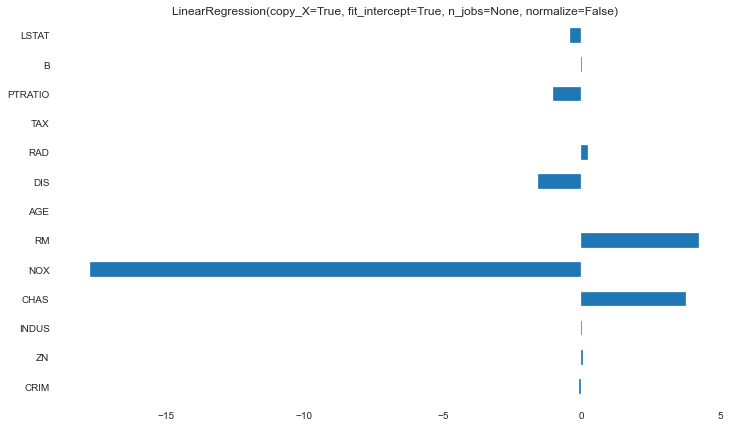

<Figure size 864x504 with 0 Axes>

Text(0.5, 1.0, "Ridge(alpha=0.1, copy_X=True, fit_intercept=True, max_iter=None, normalize=True,\n      random_state=None, solver='auto', tol=0.001)")

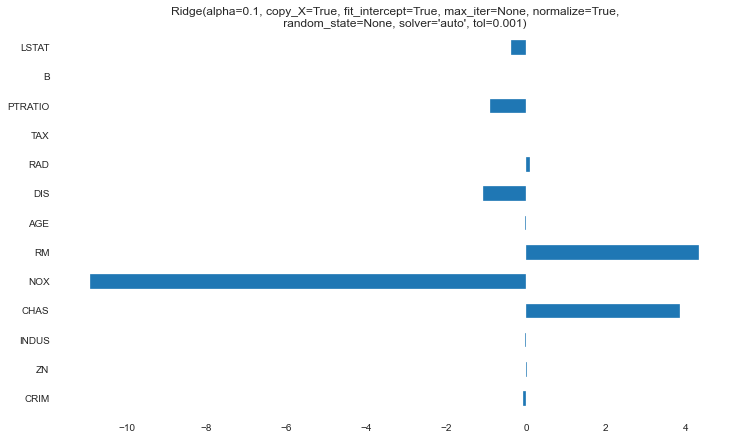

<Figure size 864x504 with 0 Axes>

Text(0.5, 1.0, "Lasso(alpha=0.1, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,\n      positive=False, precompute=False, random_state=None, selection='cyclic',\n      tol=0.0001, warm_start=False)")

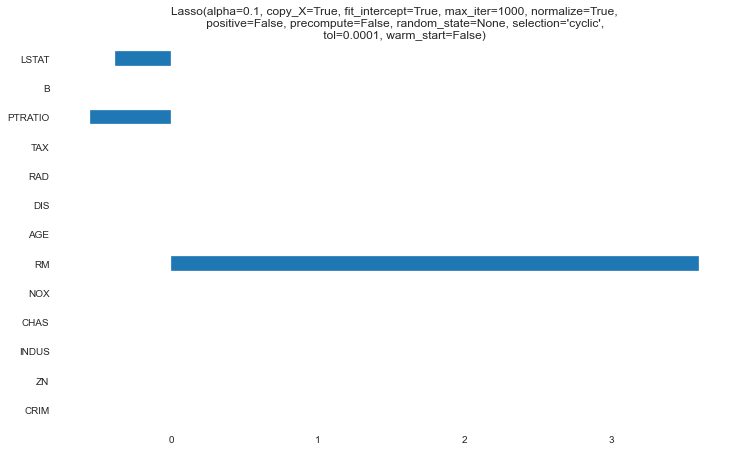

<Figure size 864x504 with 0 Axes>

Text(0.5, 1.0, "ElasticNet(alpha=1.0, copy_X=True, fit_intercept=True, l1_ratio=0.5,\n           max_iter=1000, normalize=False, positive=False, precompute=False,\n           random_state=None, selection='cyclic', tol=0.0001, warm_start=False)")

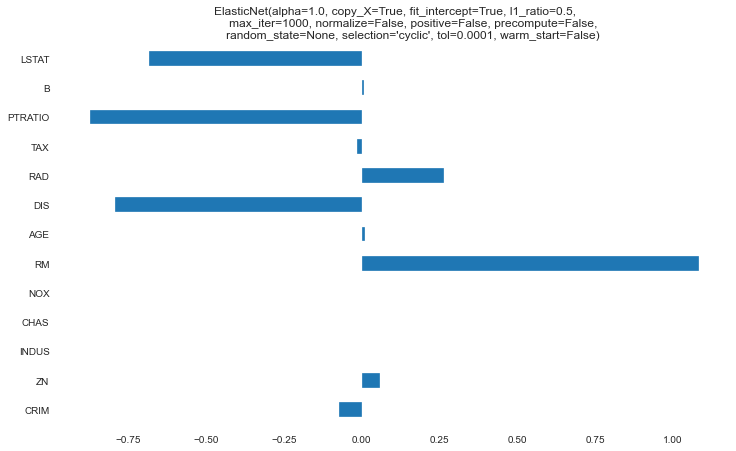

In [ ]:
# Evaluating the models
models=[linreg,ridgereg,lassoreg,elasnet]
for model in models:
    plt.figure(figsize=(12,7))
    imp=pd.Series(model.coef_, index=X.columns)
    imp.plot(kind='barh')
    plt.title(model)
    plt.show()

In [ ]:
for model in models:
    print(model)
    print('R square----',np.round(model.score(X_test,y_test)*100, 2))
    print('\n')

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)
R square---- 63.36


Ridge(alpha=0.1, copy_X=True, fit_intercept=True, max_iter=None, normalize=True,
      random_state=None, solver='auto', tol=0.001)
R square---- 61.79


Lasso(alpha=0.1, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False)
R square---- 51.87


ElasticNet(alpha=1.0, copy_X=True, fit_intercept=True, l1_ratio=0.5,
           max_iter=1000, normalize=False, positive=False, precompute=False,
           random_state=None, selection='cyclic', tol=0.0001, warm_start=False)
R square---- 61.83




In [ ]:
for model in models:
    print(model)
    y_pred=model.predict(X_test)
    print('RMSE----',np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
    print('\n')

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)
RMSE---- 5.314600990509904


Ridge(alpha=0.1, copy_X=True, fit_intercept=True, max_iter=None, normalize=True,
      random_state=None, solver='auto', tol=0.001)
RMSE---- 5.427109552124219


Lasso(alpha=0.1, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False)
RMSE---- 6.091596619651704


ElasticNet(alpha=1.0, copy_X=True, fit_intercept=True, l1_ratio=0.5,
           max_iter=1000, normalize=False, positive=False, precompute=False,
           random_state=None, selection='cyclic', tol=0.0001, warm_start=False)
RMSE---- 5.424492551144101


